# House Price Prediction

### ML Lifecycle in Data Science Project

1. Exploratory Data Analysis
2. Feature Engineering
3. Feature Selection
4. Model Building
5. Model Deployment


## 1. Exploratory Data Analysis

    "Main aim is to understand more about the data"

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

pd.pandas.set_option('display.max_columns',None)
pd.pandas.set_option('display.max_rows',None)

In [2]:
dataset = pd.read_csv('california_housing_datset.csv')

print(dataset.shape)

(20640, 10)


In [3]:
# top 5 records
dataset.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


###### In Data Analysis We will Analyze To Find out the below things

1. Missing Values
2. All The Numerical Variables
3. Distribution of the Numerical Variables
4. Categorical Variables
5. Cardinality of Categorical Variables
6. Outliers
7. Relationship between independent and dependent feature

### Missing Values

In [4]:
features_with_na = [features for features in dataset.columns if dataset[features].isnull().sum()>1]
print('Features with an Null values :',features_with_na)

Features with an Null values : ['total_bedrooms']


In [5]:
for feature in features_with_na:
    print(feature, np.round(dataset[feature].isnull().mean(), 4), "% missing values")

total_bedrooms 0.01 % missing values


###### we need to find the relationship between missing values and target column "median_house_value"

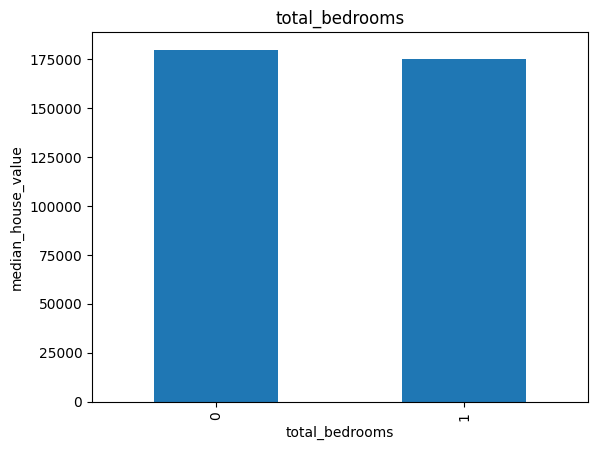

In [6]:
for feature in features_with_na:
    data = dataset.copy()
    
    # let's make a variable that indicates 1 if the observation was missing or zero otherwise
    data[feature] = np.where(data[feature].isnull(), 1, 0)
    
    # let's calculate the mean median_house_value where the information is missing or present
    data.groupby(feature)['median_house_value'].median().plot.bar()
    plt.title(feature)
    plt.ylabel('median_house_value')
    plt.show()

Here With the relation between the missing values and the dependent variable is clearly visible.So We need to replace these nan values with something meaningful which we will do in the Feature Engineering section

### Numerical Variables

In [7]:
# list of numerical variables
numerical_features = [feature for feature in dataset.columns if dataset[feature].dtypes != 'O']
print('Number of numerical variables :', len(numerical_features))

Number of numerical variables : 9


In [8]:
dataset[numerical_features].head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0


Numerical variables are usually of 2 type
1. Continous variable 
2. Discrete Variables

In [9]:
discrete_feature = [feature for feature in numerical_features if len(dataset[feature].unique())<25]
print("Discrete Variables Count: {}".format(len(discrete_feature)))

Discrete Variables Count: 0


Here no any discrete feature in dataset so no need to find the realtionship between them and target feature


### Continuous Variable

In [10]:
continuous_feature=[feature for feature in numerical_features if feature not in discrete_feature]
print("continuous feature count {}".format(len(continuous_feature)))                    

continuous feature count 9


###### ## Lets analyse the continuous values by creating histograms to understand the distribution

###### By using hist plot

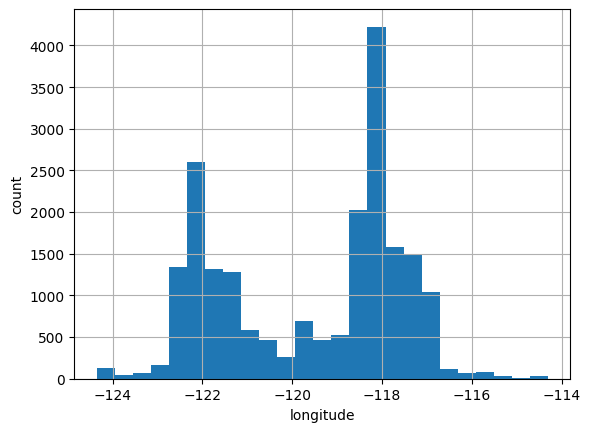

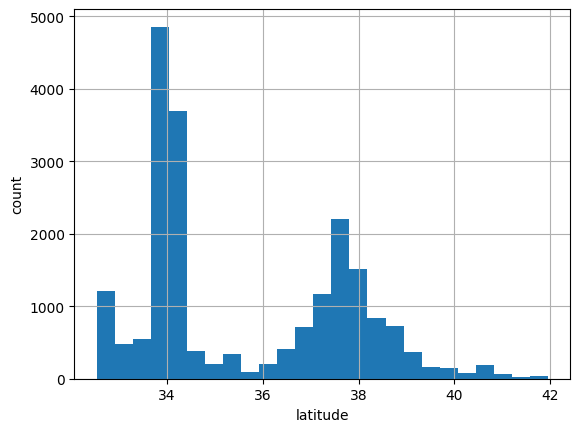

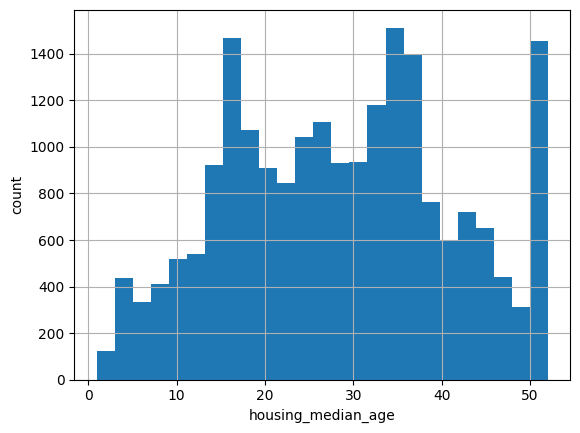

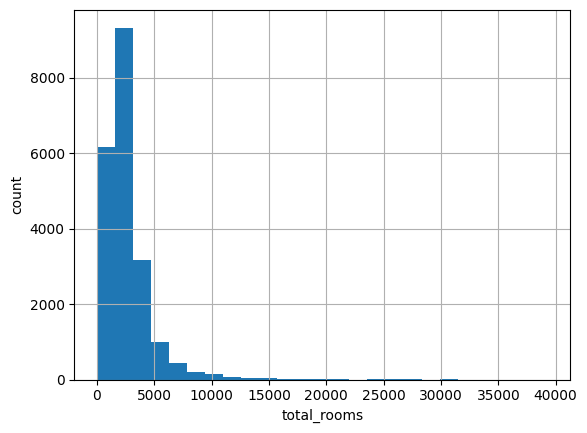

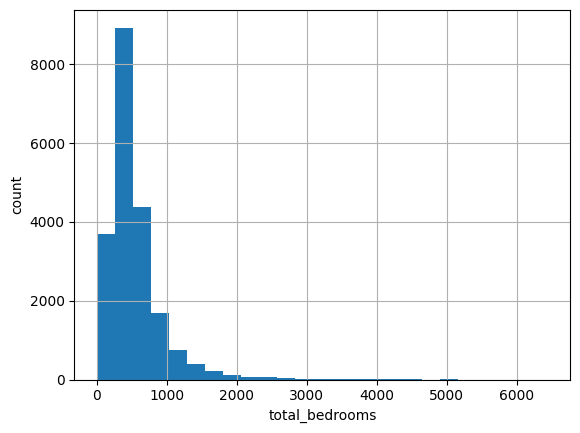

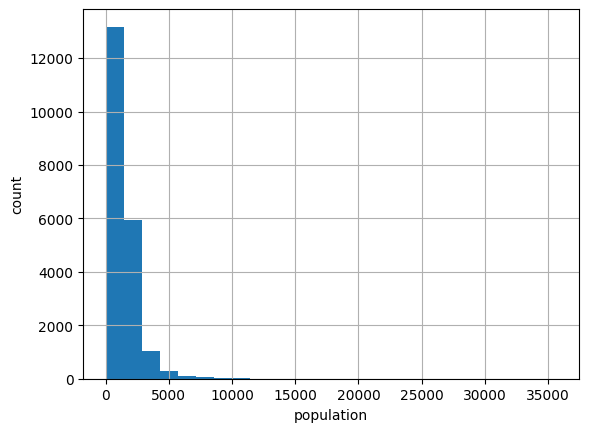

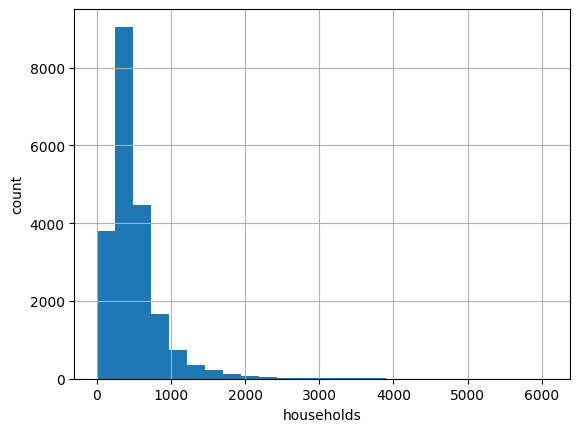

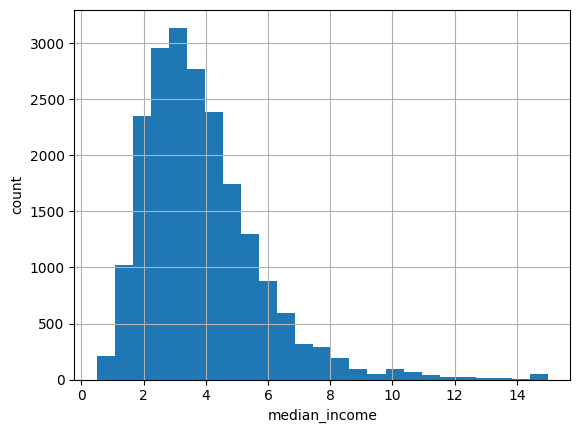

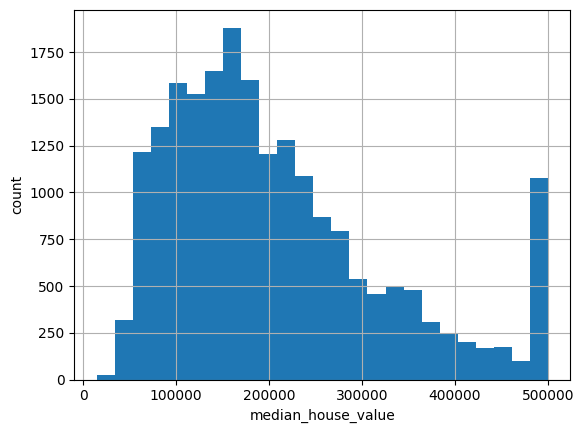

In [11]:
for feature in continuous_feature:
    data=dataset.copy()
    data[feature].hist(bins=25)
    plt.xlabel(feature)
    plt.ylabel('count')
    plt.show()

Here some of the features having nongausian distribution of datapoints , so we need to transform nongausian distribution to gausian ditribution with the help of log trasformation

###### Log trasformation

In [12]:
# for feature in continuous_feature:
#     data=dataset.copy()
#     if 0  in data[feature].unique(): # To avoid log(0) condition. Because log(0) is not defined
#         pass
#     else:
#         data[feature] = np.log(data[feature])
#         data['median_house_value'] = np.log(data['median_house_value'])
#         plt.scatter(data[feature], data['median_house_value'])
#         plt.xlabel(feature)
#         plt.ylabel('median_house_value')
#         plt.show()

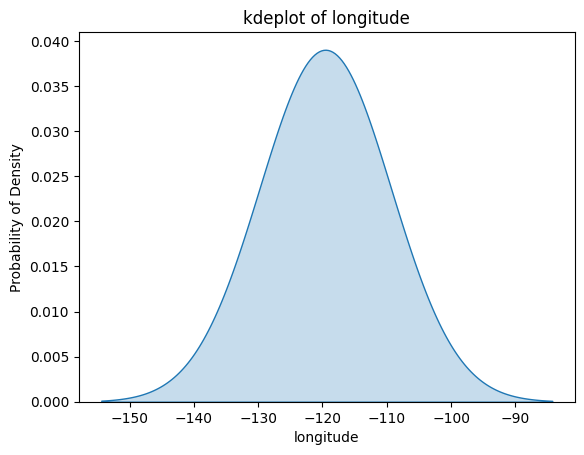

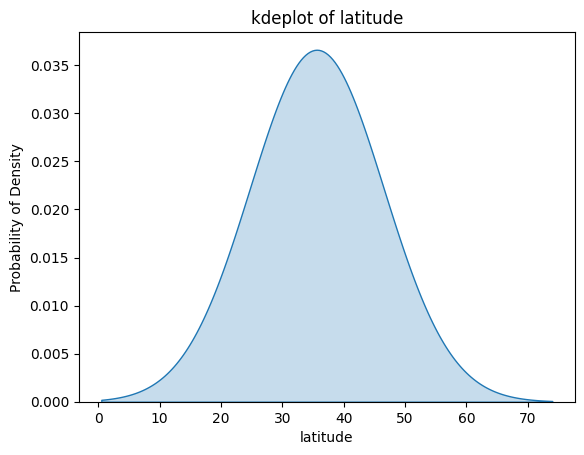

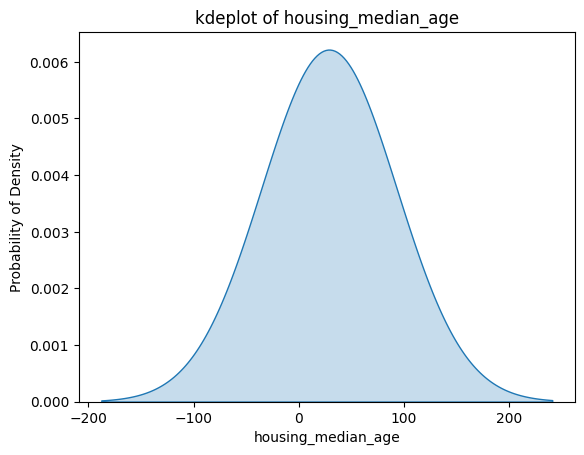

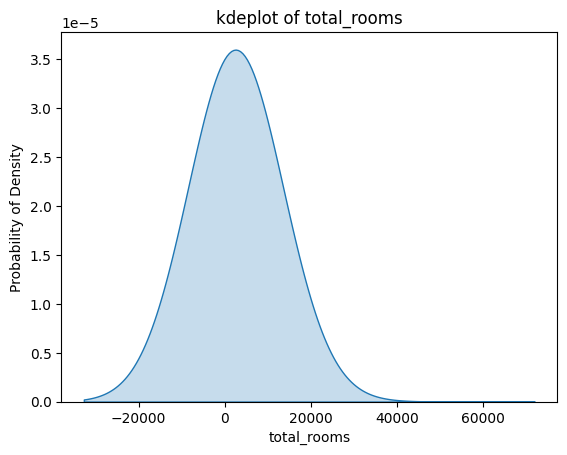

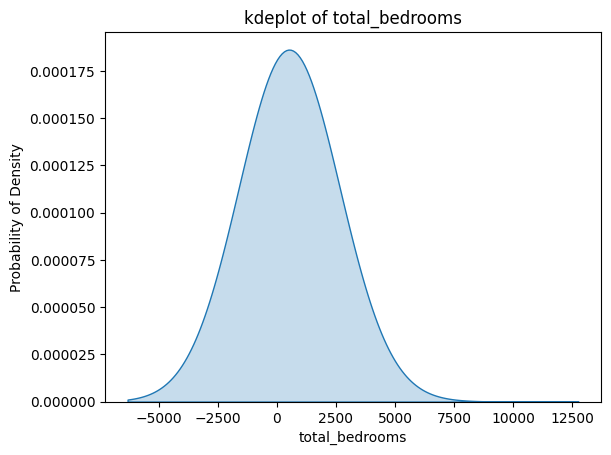

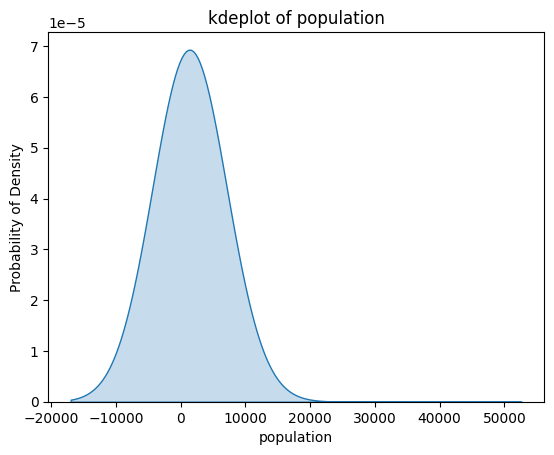

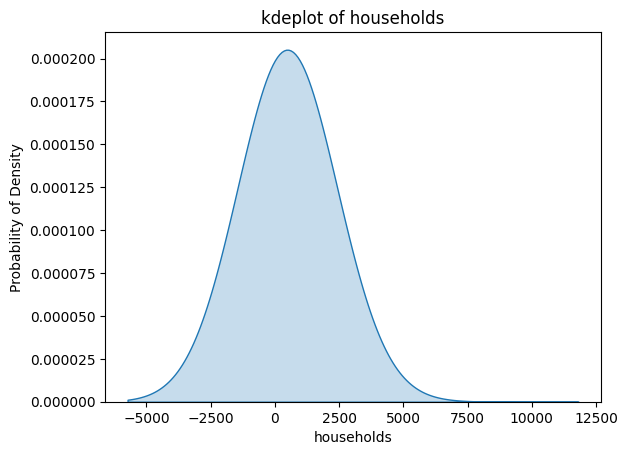

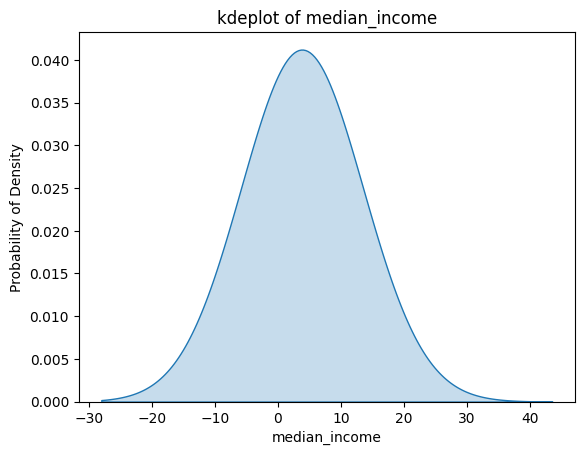

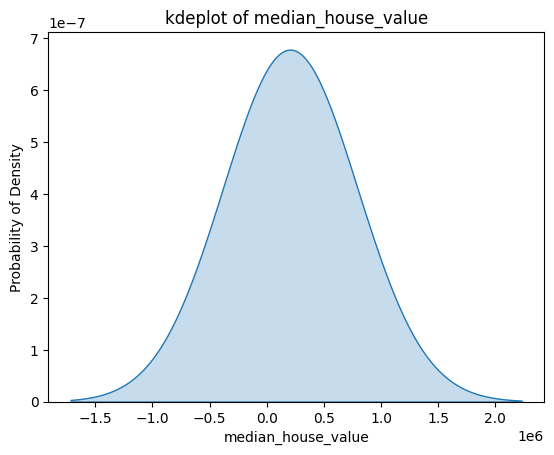

In [13]:
for feature in continuous_feature:
    plt.figure()  # Create a new figure for each boxplot
    sns.kdeplot(data[feature], fill=True, bw_method=5)
    plt.title('kdeplot of {}'.format(feature))
    plt.xlabel(feature)
    plt.ylabel('Probability of Density')
    
# Display the kdeplot
plt.show()

### Outliers

C:\Users\Digvijay Mohite\AppData\Local\Programs\Python\Python311\Lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


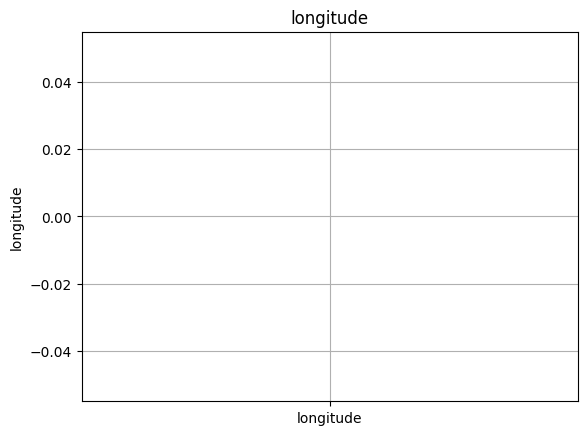

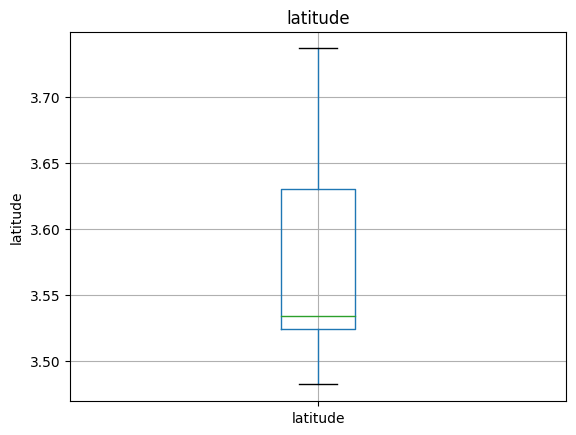

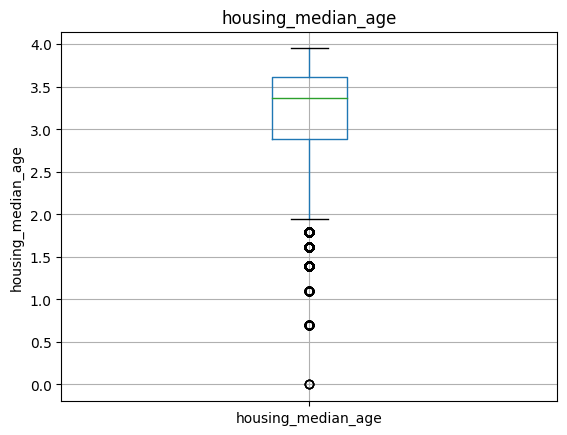

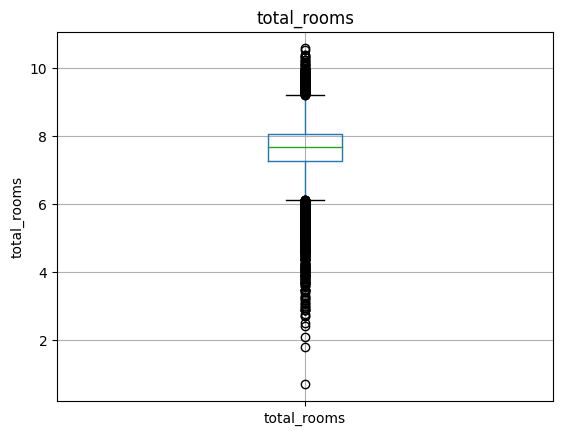

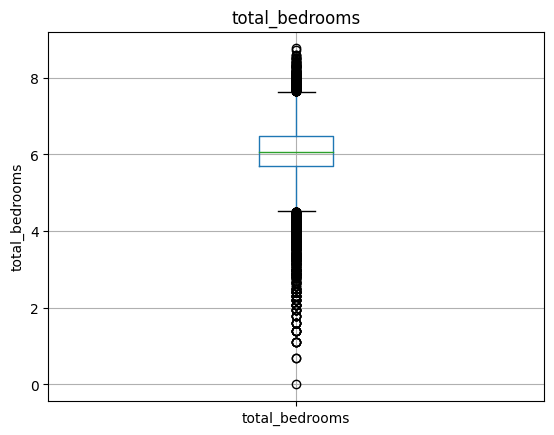

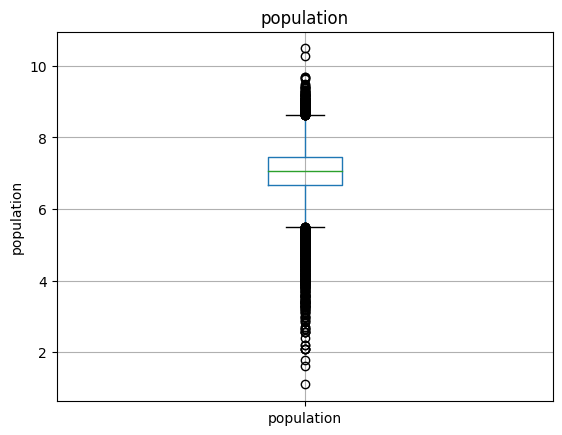

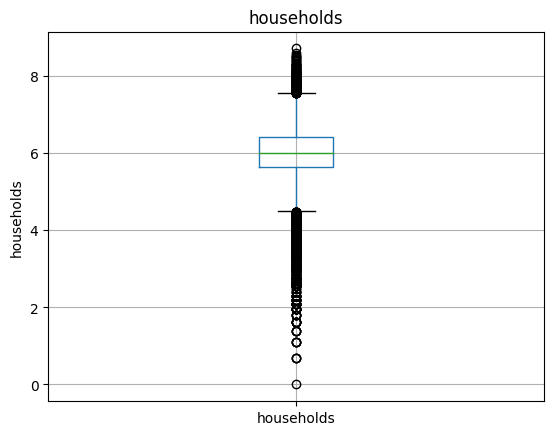

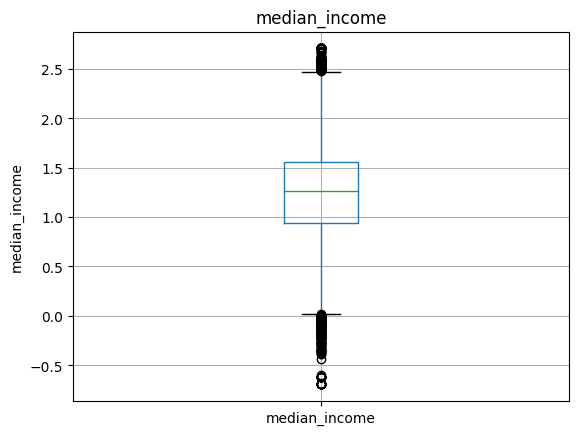

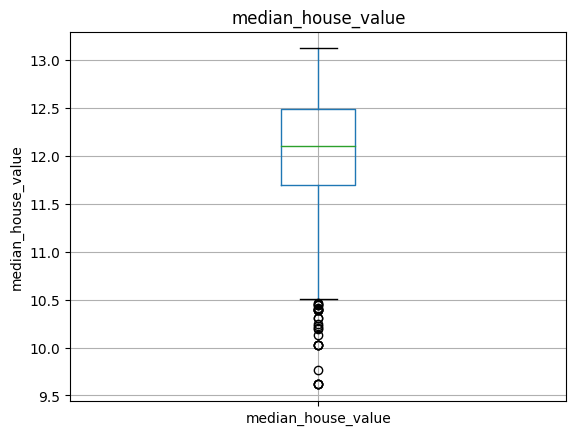

In [14]:
for feature in continuous_feature:
    data=dataset.copy()
    
    if 0 in data[feature].unique():
        pass
    else:
        data[feature]=np.log(data[feature])
        data.boxplot(column=feature) # boxplot only with continuous variables not for catagorical
        plt.ylabel(feature)
        plt.title(feature)
        plt.show()

### Categorical Variables

In [15]:
categorical_features=[feature for feature in data.columns if data[feature].dtypes=='O']
categorical_features

['ocean_proximity']

In [16]:
data[categorical_features].head()

,ocean_proximity
0,NEAR BAY
1,NEAR BAY
2,NEAR BAY
3,NEAR BAY
4,NEAR BAY


In [17]:
for feature in categorical_features:
    print('The feature is "{}" and number of catagories are "{}"'.format(feature, len(data[feature].unique())))

The feature is "ocean_proximity" and number of catagories are "5"


###### Find out the relationship between categorical variable and dependent feature "median_house_value"

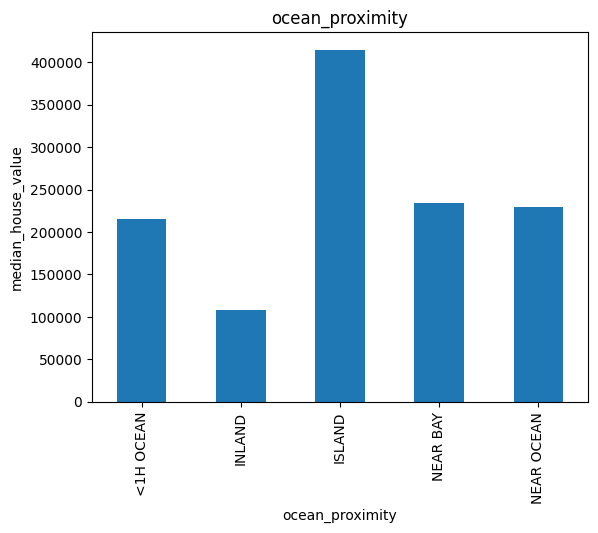

In [18]:
for feature in categorical_features:
    data = dataset.copy()
    data.groupby(feature)['median_house_value'].median().plot.bar()
    plt.xlabel(feature)
    plt.ylabel('median_house_value')
    plt.title(feature)
    plt.show()

### Multivariate Analysis

<Axes: >

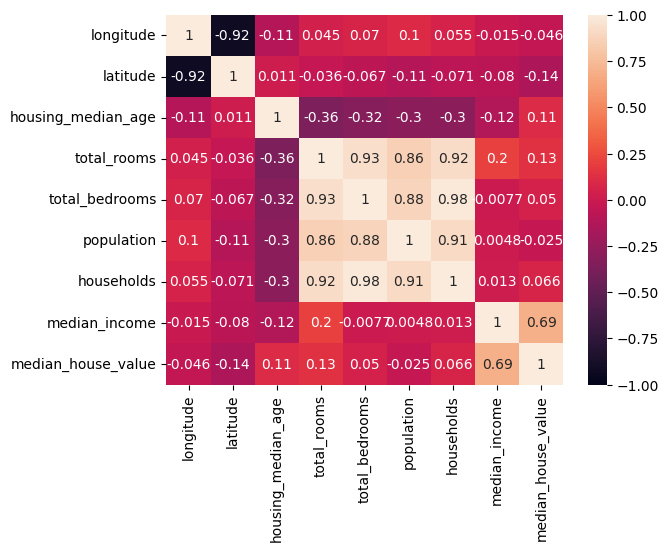

In [19]:
corr = data.select_dtypes(include=np.number).corr()
sns.heatmap(data=corr, annot=True, vmin=-1, vmax=+1,)

## 2. Feature Engineering

    "Always remember there way always be a chance of data leakage so we need to split the data first and then apply feature Engineering"

In [20]:
# from sklearn.model_selection import train_test_split

# X_train,X_test,y_train,y_test=train_test_split(data,data['median_house_value'],test_size=0.1,random_state=0)

In [21]:
# print(X_train.shape,X_test.shape,y_train.shape,y_test.shape)

### Missing values

###### Capturing all the nan values
###### 1.  lets handle "Categorical features" which are missing

In [22]:
features_nan=[feature for feature in data.columns if data[feature].isnull().sum()>1 and data[feature].dtypes=='O']

for feature in features_nan:
    print("{}: {}% missing values".format(feature,np.round(data[feature].isnull().mean(),4)))

There is no any missing value in categorical features

###### 2.  lets handle "Numerical features" which are missing

In [23]:
features_with_na = [features for features in data.columns if data[features].isnull().sum()>1]
print('Features with an Null values :',features_with_na)

for feature in features_with_na:
    print(feature, np.round(data[feature].isnull().mean(), 4), "% missing values")

Features with an Null values : ['total_bedrooms']
total_bedrooms 0.01 % missing values


###### ## Replacing the numerical Missing Values

In [24]:
for feature in features_with_na:
    ## We will replace by using median since there are outliers
    median_value=data[feature].median()
    
    ## create a new feature to capture nan values
    data[feature+'nan']=np.where(data[feature].isnull(),1,0)
    data[feature].fillna(median_value,inplace=True)
    
data[features_with_na].isnull().sum()

total_bedrooms    0
dtype: int64

In [25]:
data.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,total_bedroomsnan
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY,0
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY,0
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY,0
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY,0
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY,0


### Encoding 
    "process of representing categorical variables or data in a numerical format that can be understood and processed by machine learning algorithms or statistical models. " 

In [26]:
categorical_features

['ocean_proximity']

In [27]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
le

LabelEncoder()

In [28]:
# fit labelencoder on "ocean_proximity"
le.fit(data['ocean_proximity'])

LabelEncoder()

In [29]:
# fit transform
data['ocean_proximity'] = le.fit_transform(data['ocean_proximity'])

In [30]:
# check data
data['ocean_proximity'].sample(10)

18857    1
17344    0
8351     0
7680     0
6688     1
1694     3
908      0
10821    0
6869     0
10341    0
Name: ocean_proximity, dtype: int32

In [31]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20640 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  int32  
 10  total_bedroomsnan   20640 non-null  int32  
dtypes: float64(9), int32(2)
memory usage: 1.6 MB


##### Outlier Removing

In [32]:
median_1 = data['households'].median()
median_1

409.0

In [33]:
median_2 = data['housing_median_age'].median()
median_2

29.0

In [34]:
median_3 = data['median_house_value'].median()
median_3

179700.0

In [35]:
data['households'].fillna(median_1, inplace=True )
data['housing_median_age'].fillna(median_2, inplace=True )
data['median_house_value'].fillna(median_3, inplace=True )

In [36]:
data.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,total_bedroomsnan
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,3,0
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,3,0
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,3,0
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,3,0
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,3,0


## 3. Feature Selection

In [37]:
# for feature selection we need to import following library
from sklearn.linear_model import Lasso
from sklearn.feature_selection import SelectFromModel

###### step 1. by using "Lasso"

here we need to select a suitable alpha (equivalent of penalty), The bigger the alpha the less features that will be selected.

###### step 2. by using "selectFromModel"

Then I use the selectFromModel object from sklearn, which will select the features which coefficients are non-zero

In [38]:
feature_sel_model = SelectFromModel(Lasso(alpha=0.005, random_state=0)) 
feature_sel_model.fit(data, data['median_house_value'])

SelectFromModel(estimator=Lasso(alpha=0.005, random_state=0))

In [39]:
feature_sel_model.get_support()

array([False, False,  True, False, False, False,  True, False,  True,
       False, False])

In [40]:
selected_feat = data.columns[(feature_sel_model.get_support())]
selected_feat

Index(['housing_median_age', 'households', 'median_house_value'], dtype='object')

## 4. Model Building

In [41]:
data.columns

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value', 'ocean_proximity', 'total_bedroomsnan'],
      dtype='object')

In [42]:
# data = data.drop(columns = ['longitude', 'latitude',  'total_rooms',
#        'total_bedrooms', 'population',  'median_income',
#         'ocean_proximity', 'total_bedroomsnan'], axis=1)

In [43]:
data.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,total_bedroomsnan
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,3,0
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,3,0
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,3,0
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,3,0
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,3,0


In [44]:
from sklearn.preprocessing import MinMaxScaler,StandardScaler

In [45]:
X = data.drop('median_house_value',axis=1)
y = data['median_house_value']

In [46]:
Norm=MinMaxScaler()
Norm.fit(X) # Norm.fit_transform(x)
Norm_array=Norm.transform(X)
df_new=pd.DataFrame(Norm_array,columns=X.columns)
df_new

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,total_bedroomsnan
0,0.211155,0.567481,0.784314,0.022331,0.019863,0.008941,0.020556,0.539668,0.75,0.0
1,0.212151,0.565356,0.392157,0.180503,0.171477,0.067210,0.186976,0.538027,0.75,0.0
2,0.210159,0.564293,1.000000,0.037260,0.029330,0.013818,0.028943,0.466028,0.75,0.0
3,0.209163,0.564293,1.000000,0.032352,0.036313,0.015555,0.035849,0.354699,0.75,0.0
4,0.209163,0.564293,1.000000,0.041330,0.043296,0.015752,0.042427,0.230776,0.75,0.0
5,0.209163,0.564293,1.000000,0.023323,0.032899,0.011491,0.031574,0.243921,0.75,0.0
6,0.209163,0.563231,1.000000,0.064423,0.075729,0.030578,0.084361,0.217873,0.75,0.0
7,0.209163,0.563231,1.000000,0.078895,0.106456,0.032344,0.106233,0.180694,0.75,0.0
8,0.208167,0.563231,0.803922,0.064932,0.103042,0.033717,0.097681,0.108998,0.75,0.0
9,0.209163,0.563231,1.000000,0.090213,0.109559,0.043387,0.117250,0.220087,0.75,0.0


In [47]:
from sklearn.model_selection import train_test_split

In [48]:
X_train,X_test,y_train,y_test=train_test_split(df_new,y,test_size=0.20,random_state=0)

print(X_train.shape,X_test.shape,y_train.shape,y_test.shape)

(16512, 10) (4128, 10) (16512,) (4128,)


In [49]:
y.head()

0    452600.0
1    358500.0
2    352100.0
3    341300.0
4    342200.0
Name: median_house_value, dtype: float64

In [50]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso

lr_model = LinearRegression()
lr_model

LinearRegression()

In [64]:
rr_model = Ridge(alpha=15)
rr_model

Ridge(alpha=15)

In [65]:
las_model = Lasso(alpha=0.005)
las_model

Lasso(alpha=0.005)

In [53]:
lr_model.fit(X_train, y_train)

LinearRegression()

In [66]:
rr_model.fit(X_train, y_train)

Ridge(alpha=15)

In [67]:
las_model.fit(X_train, y_train)

Lasso(alpha=0.005)

In [56]:
# checking model functions
dir(lr_model)

['__abstractmethods__',
 '__annotations__',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_abc_impl',
 '_check_feature_names',
 '_check_n_features',
 '_decision_function',
 '_estimator_type',
 '_get_param_names',
 '_get_tags',
 '_more_tags',
 '_parameter_constraints',
 '_repr_html_',
 '_repr_html_inner',
 '_repr_mimebundle_',
 '_set_intercept',
 '_validate_data',
 '_validate_params',
 'coef_',
 'copy_X',
 'feature_names_in_',
 'fit',
 'fit_intercept',
 'get_params',
 'intercept_',
 'n_features_in_',
 'n_jobs',
 'positive',
 'predict',
 'rank_',
 'score',
 'set_params',
 'singular_']

In [57]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

###### Error in Linear Regression

In [58]:
# Training Data Error

pred_train = lr_model.predict(X_train)

r2 =r2_score(pred_train,y_train)
print("R2 Score :",r2)

mse =mean_squared_error(pred_train,y_train)
print("MSE :",mse)

mae =mean_absolute_error(pred_train,y_train)
print("MAE :",mae)

R2 Score : 0.4323490035069769
MSE : 4846282224.676981
MAE : 50930.49237719212


In [59]:
# Testing Data Error

pred_test = lr_model.predict(X_test)

r2 =r2_score(pred_test, y_test)
print("R2 Score :",r2)

mse =mean_squared_error(pred_test, y_test)
print("MSE :",mse)

mae =mean_absolute_error(pred_test, y_test)
print("MAE :",mae)

R2 Score : 0.40447036502297695
MSE : 4875822102.635723
MAE : 51054.80264912042


#### Error in Ridge Regression

In [68]:
# Training Data Error

pred_train = rr_model.predict(X_train)

r2 =r2_score(pred_train,y_train)
print("R2 Score :",r2)

mse =mean_squared_error(pred_train,y_train)
print("MSE :",mse)

mae =mean_absolute_error(pred_train,y_train)
print("MAE :",mae)

R2 Score : 0.26359913305230587
MSE : 5223169496.658805
MAE : 53383.33282147389


In [69]:
# Testing Data Error

pred_test = rr_model.predict(X_test)

r2 =r2_score(pred_test, y_test)
print("R2 Score :",r2)

mse =mean_squared_error(pred_test, y_test)
print("MSE :",mse)

mae =mean_absolute_error(pred_test, y_test)
print("MAE :",mae)

R2 Score : 0.21396904377489223
MSE : 5330725333.613879
MAE : 53764.240319749544


###### Error in Lasso Regression

In [70]:
# Training Data Error

pred_train = las_model.predict(X_train)

r2 =r2_score(pred_train,y_train)
print("R2 Score :",r2)

mse =mean_squared_error(pred_train,y_train)
print("MSE :",mse)

mae =mean_absolute_error(pred_train,y_train)
print("MAE :",mae)

R2 Score : 0.43234627730730224
MSE : 4846282225.179068
MAE : 50930.51539818995


In [71]:
# Testing Data Error

pred_test = las_model.predict(X_test)

r2 =r2_score(pred_test, y_test)
print("R2 Score :",r2)

mse =mean_squared_error(pred_test, y_test)
print("MSE :",mse)

mae =mean_absolute_error(pred_test, y_test)
print("MAE :",mae)

R2 Score : 0.40446701911506977
MSE : 4875825488.264154
MAE : 51054.84694402024
